9


  0%|          | 0/9 [00:00<?, ?it/s]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q180392_002_0.jpg
gt: 1/15 pred: 1/1 other: 0
fn: 14


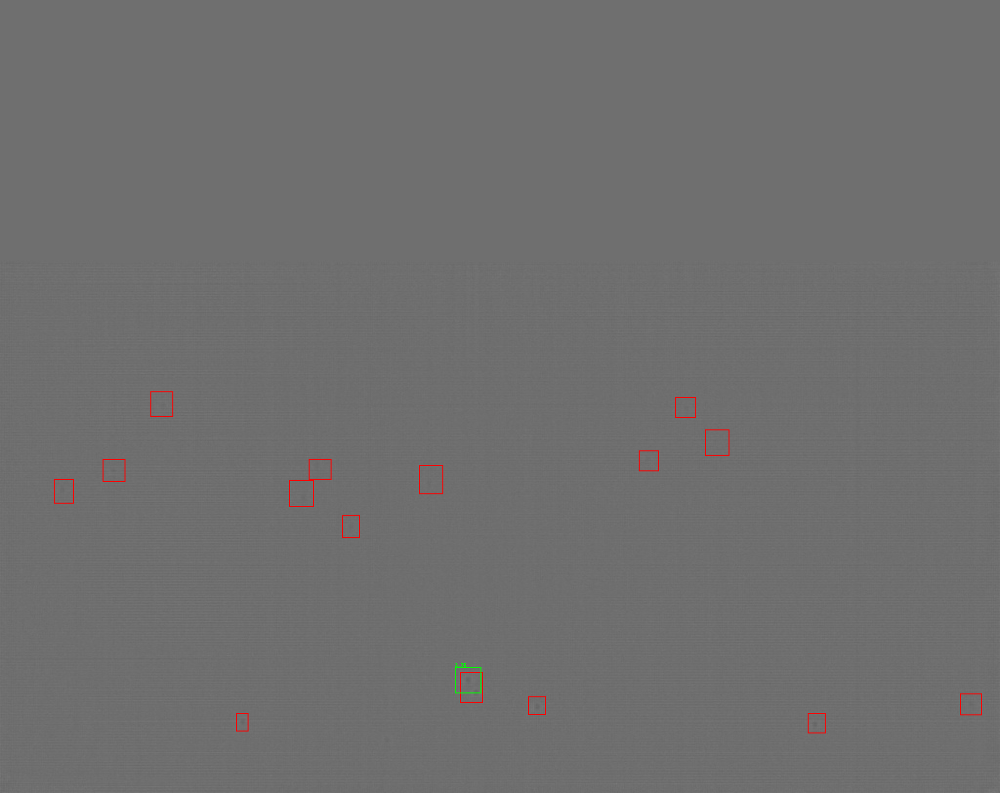

 11%|█         | 1/9 [00:01<00:14,  1.78s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q1804LV_002_1.jpg
gt: 2/16 pred: 2/2 other: 0
fn: 14


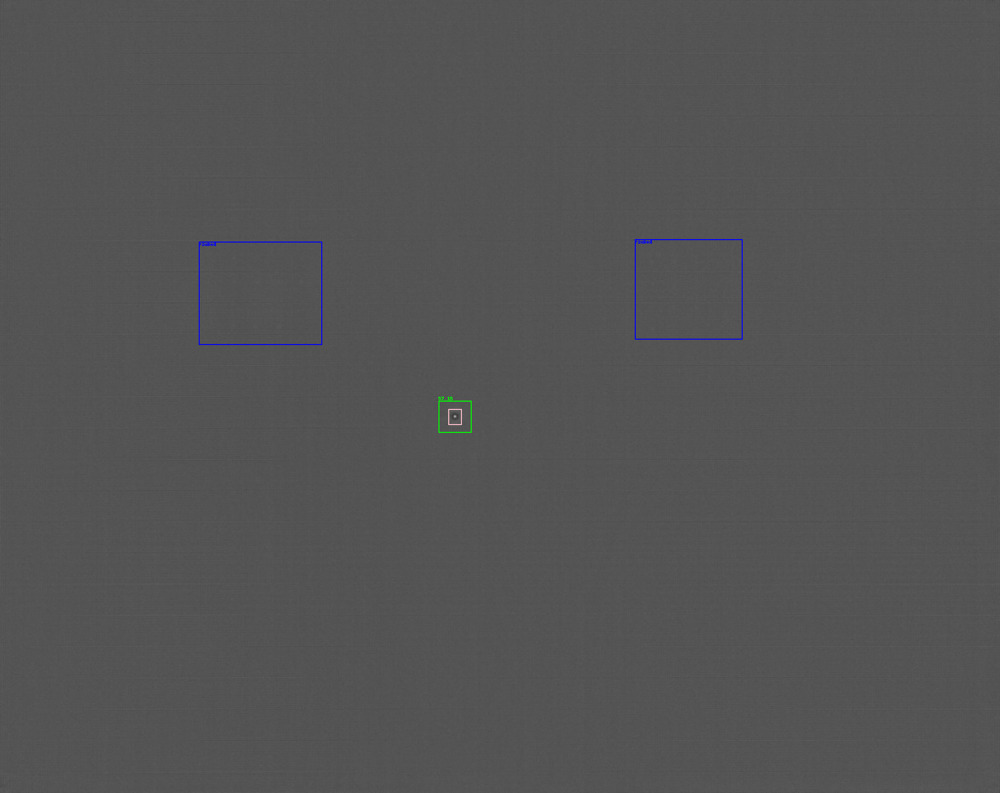

 22%|██▏       | 2/9 [00:03<00:13,  1.87s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q1803W4_004_2.jpg
gt: 3/17 pred: 3/3 other: 0
fn: 14


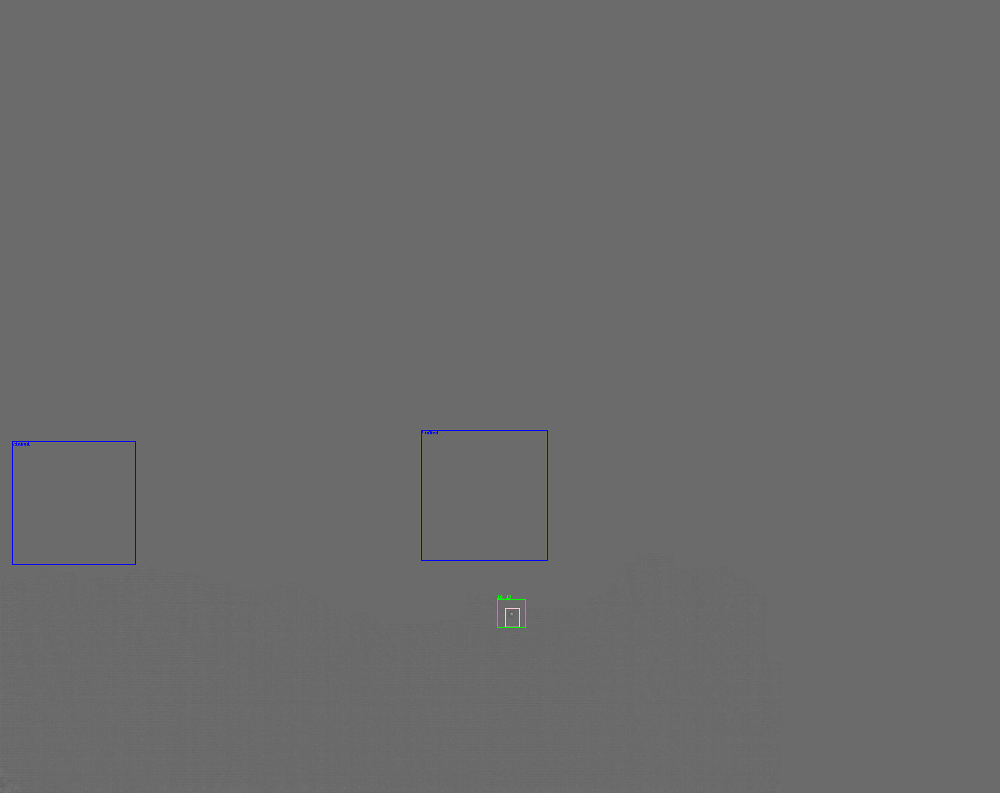

 33%|███▎      | 3/9 [00:05<00:10,  1.72s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q18086Q_002_1.jpg
gt: 4/18 pred: 4/4 other: 0
fn: 14


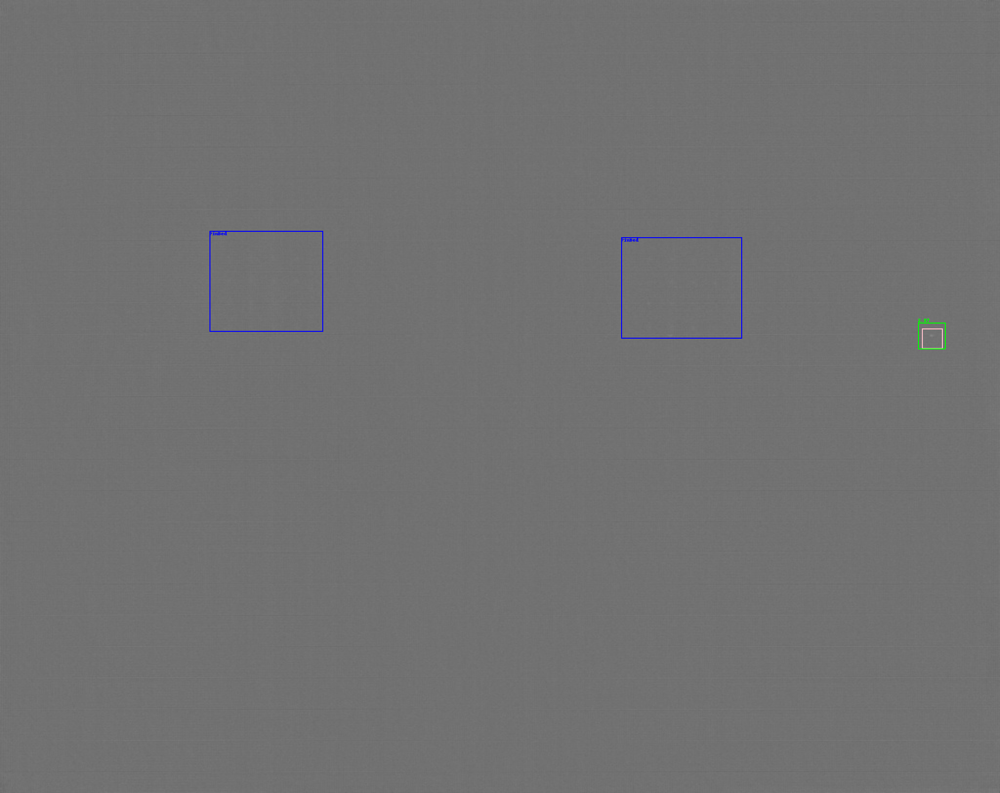

 44%|████▍     | 4/9 [00:07<00:08,  1.77s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q180458_002_1.jpg
gt: 5/19 pred: 5/5 other: 0
fn: 14


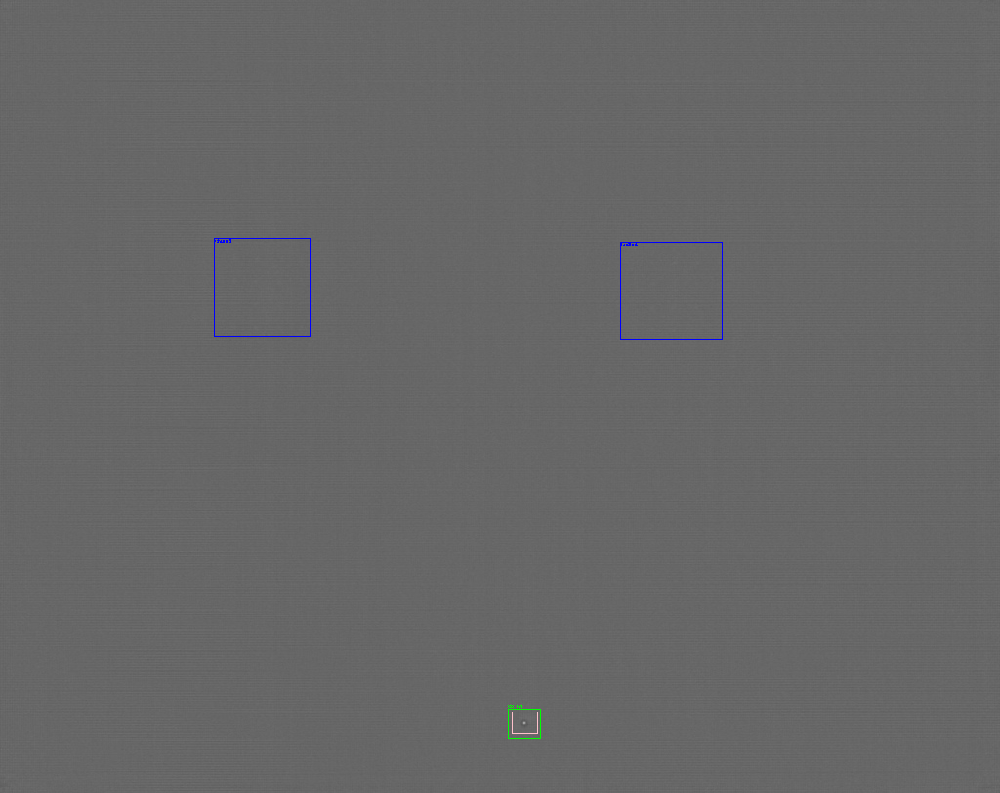

 56%|█████▌    | 5/9 [00:09<00:07,  1.84s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q1803TD_002_0.jpg
gt: 5/39 pred: 5/5 other: 0
fn: 34


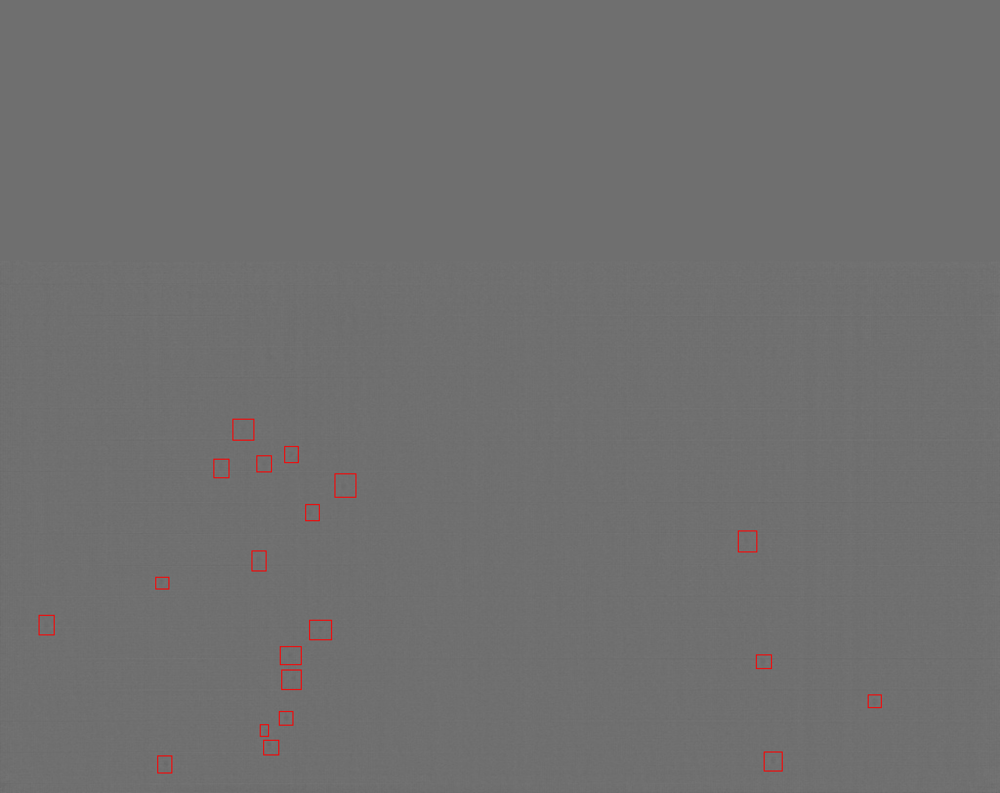

 67%|██████▋   | 6/9 [00:10<00:05,  1.75s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q1803HM_002_0.jpg
gt: 5/47 pred: 5/5 other: 0
fn: 42


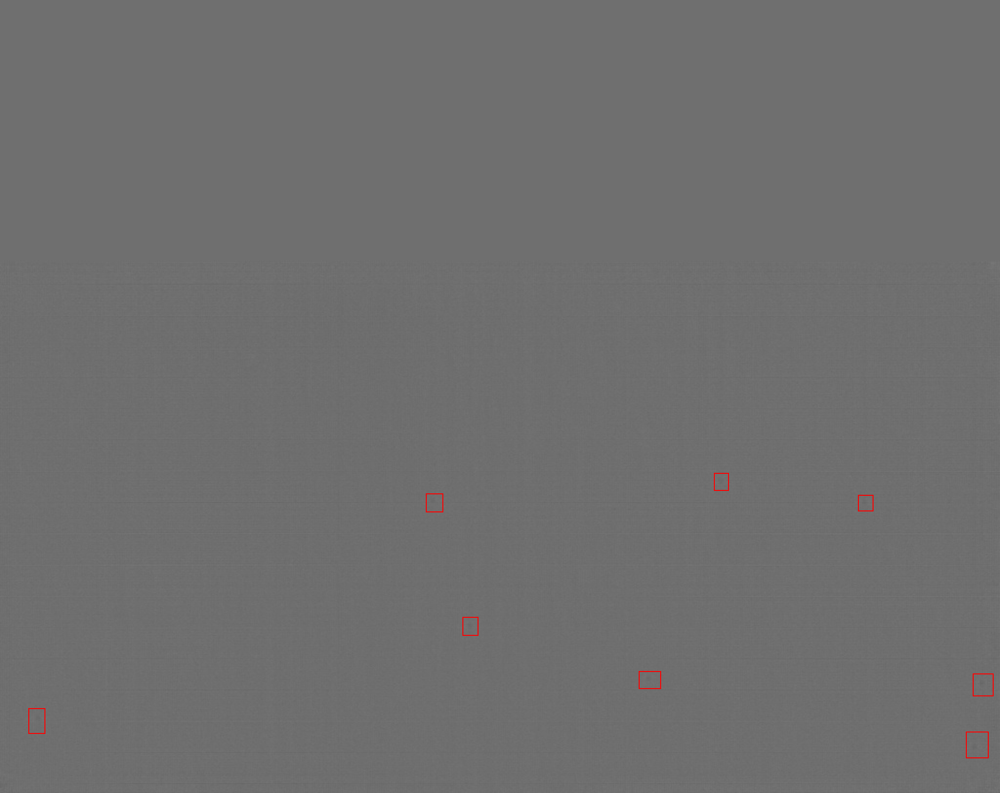

 78%|███████▊  | 7/9 [00:12<00:03,  1.71s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD86Q1804P3_001_1.jpg
gt: 6/48 pred: 6/6 other: 0
fn: 42


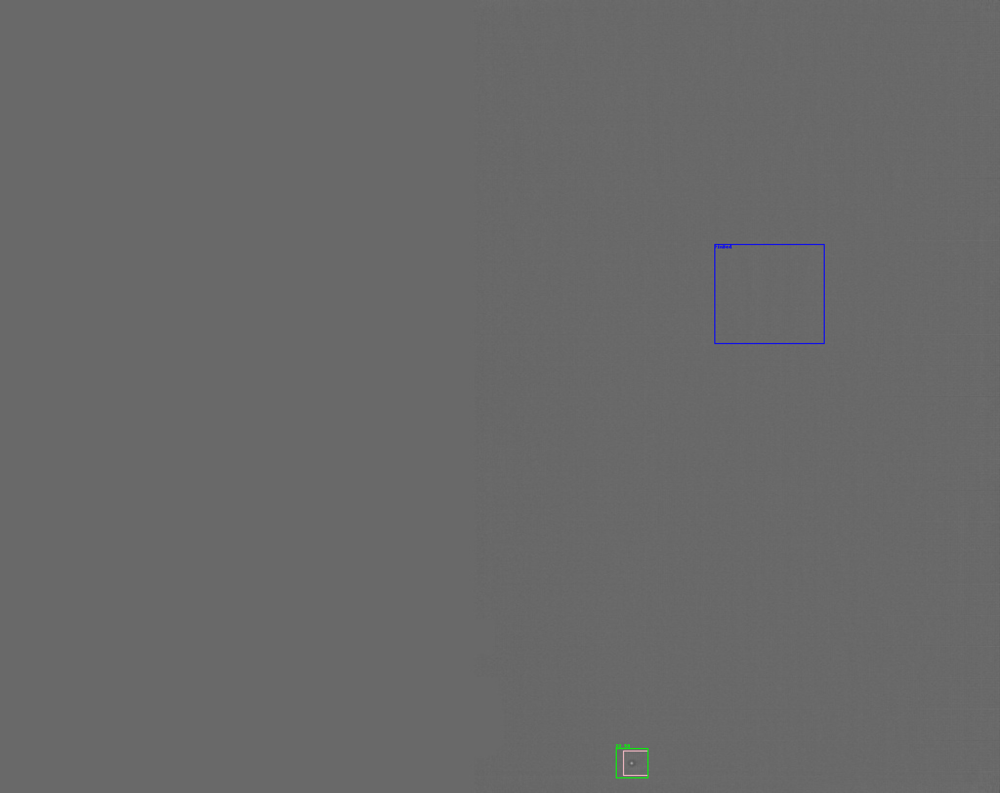

 89%|████████▉ | 8/9 [00:13<00:01,  1.67s/it]

/home/mura/daniel/data/smura_classification/Spot/visualize/TD85Q171NLW_003_1.jpg
gt: 6/49 pred: 6/6 other: 0
fn: 43


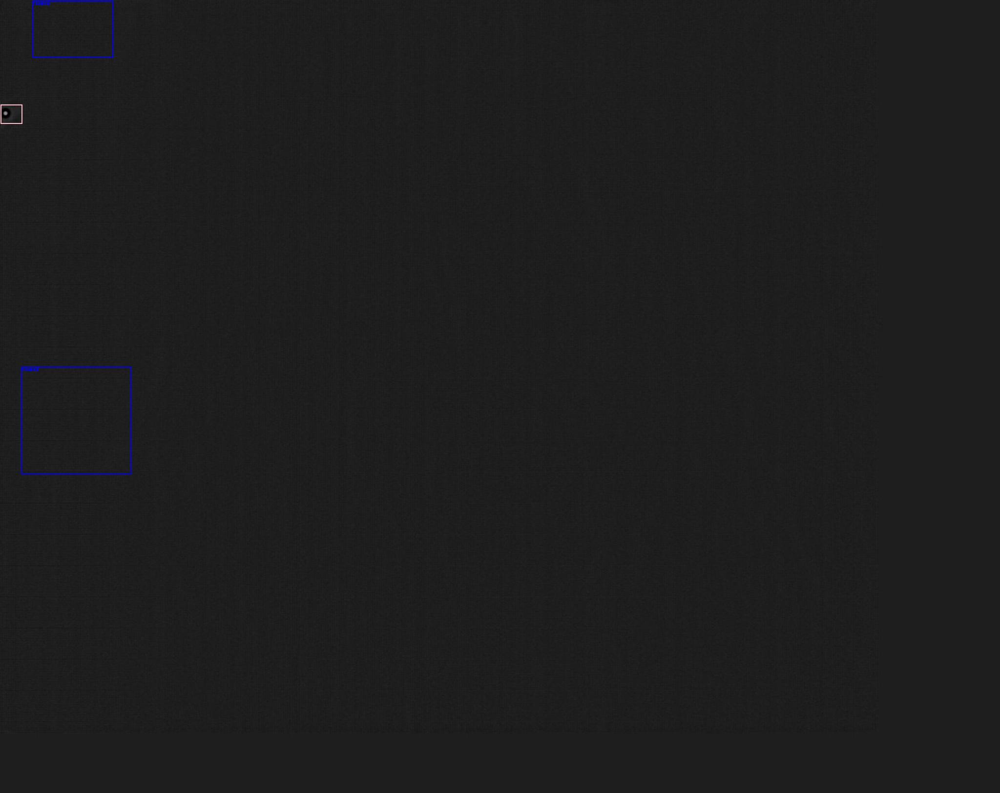

100%|██████████| 9/9 [00:16<00:00,  1.81s/it]

True Positives (TP): 6
False Positives (FP): 0
False Negatives (FN): 43
Precision: 1.00
Recall: 0.12


In [13]:
from pathlib import Path
import pandas as pd
from PIL import Image
import numpy as np
from tqdm.auto import tqdm
from PIL import ImageDraw
import cv2 as cv
import os
from glob import glob

all_df = pd.read_parquet('/home/mura/daniel/0921_cf_mura/smura/cf_mura_b2/cf_mura_b2.parquet').dropna()

# width, height = 2048, 1625
# x = all_df.x * width
# y = all_df.y * height
# w = all_df.w * width
# h = all_df.h * height
# all_df['x1'] = (x - w/2).round().astype(int)
# all_df['y1'] = (y - h/2).round().astype(int)
# all_df['x2'] = (x + w/2).round().astype(int)
# all_df['y2'] = (y + h/2).round().astype(int)

def get_frame_region(imga, erode=5, dilate=21, debug=False):
    mask = imga>=180
    mask = mask | (imga==0)
    mask = cv.erode(np.uint8(mask), np.ones((erode, erode)))
    mask = (mask>0)|(imga>=250)
    mask = cv.dilate(np.uint8(mask), np.ones((dilate,dilate)))
    n_components, components, stats, _ = cv.connectedComponentsWithStats(mask)
    for n in range(1, n_components):
        if stats[n][-1] < 10000:
            mask[components==n] = 0
    return mask==0

# 原圖過白時使用
def get_frame_region_2(imga, erode=5, dilate=21, debug=False):
    mask = imga>=253
    mask = mask | (imga==0)
    mask = cv.erode(np.uint8(mask), np.ones((erode, erode)))
    #mask = (mask>0)|(imga>=250)
    mask = cv.dilate(np.uint8(mask), np.ones((dilate,dilate)))
    n_components, components, stats, _ = cv.connectedComponentsWithStats(mask)
    for n in range(1, n_components):
        if stats[n][-1] < 10000:
            mask[components==n] = 0
    return mask==0

def fft_denoise(imga:np.ndarray) -> np.ndarray:
    f = np.fft.fft2(imga)
    mask = np.zeros(f.shape, dtype=bool)
    mask[:200, 500:800]=True
    mask[-200:, 500:800]=True
    mask[:200, -800:-500]=True
    mask[-200:, -800:-500]=True
    mask[400:650, :200]=True
    mask[400:650, -200:]=True
    mask[-650:-400, :200]=True
    mask[-650:-400, -200:]=True
    f[mask]=np.abs(f).mean()
    imga2 = np.fft.ifft2(f)
    return imga2

def get_ksize(sigma):
    return int(((sigma - 0.8)/0.15) + 2.0)

def get_gaussian_blur(img, ksize=0, sigma=5):
    if ksize == 0:
        ksize = get_ksize(sigma)
    sep_k = cv.getGaussianKernel(ksize, sigma)
    # if ksize >= 11, then convolution is computed by applying fourier transform
    return cv.filter2D(img, -1, np.outer(sep_k, sep_k))

def ssr(img, sigma):
    return np.log10(img) - np.log10(get_gaussian_blur(img, ksize=0, sigma=sigma) + 1.0)

def ssr2(img, sigma):
    return img - get_gaussian_blur(img, ksize=0, sigma=11)

def adaptive_diff(imga:np.ndarray, median_blur_ksize=7, sigma=11, mask=None, edge_distance=5):
    imga2 = fft_denoise(imga)
    imga2 = imga2.real.clip(0, 255).astype(np.uint8)
    if mask is not None:
        imga2[~mask] = imga2[mask].mean()
    imga2 = cv.medianBlur(imga2, median_blur_ksize)
    imga3 = ssr2(imga2.astype(np.float32), sigma)
    # ignore pixels near edges
    imga3[:edge_distance]=0
    imga3[-edge_distance:]=0
    imga3[:,:edge_distance]=0
    imga3[:,-edge_distance:]=0
    return imga3

def join_path(p1,p2):
    return os.path.join(p1,p2)

pred_total = 0
gt_total = 0
gt_correct= 0
pred_correct = 0
pred_other = 0
spot_sums_correct = []
spot_sums_other = []
spot_sums_incorrect = []
spot_sum_threshold = 2.5
class_names = ['WhiteSpot', 'BlackSpot']
# all_images = all_df.image_path.unique()
img_folder = '/home/mura/daniel/data/smura_classification/Spot/visualize'
img_list = glob(f"{join_path(img_folder, '*jpg')}")
all_images = img_list
print(len(all_images))
max_overlapping_boxes = 10  # Number of overlapping boxes to trigger skipping

for img_fn in tqdm(all_images):
    print(img_fn)
    filename = os.path.basename(img_fn) # 取得檔名
    filename = os.path.splitext(filename)[0] # 取得檔名
    # print(filename)

    # 預測瑕疵
    has_overkill = False
    has_missed = False
    
    img = Image.open(img_fn).convert('RGB')
    img = img.resize((2048,1625))
    # display(img)
    imga = np.array(img)[..., 0]
    # 先找出ROI區域
    ROI = get_frame_region(imga, dilate=21)
    # 如果上方找到的ROI區域完全是黑色，代表遇到原圖過白的問題，使用get_frame_region_2重新找ROI區域
    if np.sum(ROI) == 0:
        ROI = get_frame_region_2(imga, dilate=21)
    imga3 = adaptive_diff(imga, median_blur_ksize=5, sigma=23, mask = ROI, edge_distance=15)
    mask = np.abs(imga3)>8
    ROI_eroded = cv.erode(np.uint8(ROI), np.ones((45, 45))) >0
    imga3[~ROI_eroded] = 0
    mask = mask & ROI_eroded
    mask = np.uint8(mask*255)
    mask = cv.erode(mask, np.ones((1,1)))
    mask = cv.dilate(mask, np.ones((11,11)))
    # 顯示做fft denoised and retinex後的mask
    #showmask = Image.fromarray(mask).convert('RGB')
    #display(showmask)

    # 判斷整張圖片是否有白色連通區域過於集中的地方，如果有就跳過，沒有則繼續執行後方程式碼
    # 先找出判斷是spot瑕疵的預測框
    img_path = img_fn
    tmp = img_path.split('/')[-1]
    rows = all_df[all_df.fn==tmp]

    #rows = all_df[all_df.image_path==img_fn]
    spot_mask = np.zeros_like(mask)
    othermura_mask = np.zeros_like(mask)
    for r in rows.itertuples():
        if r.smura_name in class_names:
            spot_mask[r.y0:r.y1+1, r.x0:r.x1+1]=255
        else:
            othermura_mask[r.y0:r.y1+1, r.x0:r.x1+1]=255
    n_components, components, stats, _ = cv.connectedComponentsWithStats(mask)
    spot_sums = []
    for n in range(1, n_components):
        comp = components==n
        spot_sum = (imga3[comp]**2).sum()/1000
        spot_sums.append(spot_sum)
    predicted_boxes = []
    for r, spot_sum in zip(stats[1:], spot_sums):
        # Add the bounding box to the list of predicted boxes
        predicted_boxes.append((r[0], r[1], r[0] + r[2], r[1] + r[3]))
    #print("predicted_boxes num:", len(predicted_boxes))

    # 查看找出的預測框是否有重疊
    overlapping_boxes = 0
    for i, box1 in enumerate(predicted_boxes):
        for j, box2 in enumerate(predicted_boxes):
            if i != j:  # Skip comparing the same box with itself
                x1_1, y1_1, x2_1, y2_1 = box1
                x1_2, y1_2, x2_2, y2_2 = box2
                # Check if the two boxes overlap
                if (
                    x1_1 < x2_2 and x2_1 > x1_2 and
                    y1_1 < y2_2 and y2_1 > y1_2
                ):
                    overlapping_boxes += 1
    #print("overlapping_boxes num:", overlapping_boxes)

    # 如果有10個以上的預測框重疊再一起，就先跳過，之後再另外處理，代表可能有大片dirt
    if overlapping_boxes >= max_overlapping_boxes:
        print(f"Skipping {img_fn} due to {overlapping_boxes} overlapping boxes")
        continue

    # 當找到白色連通區域面積過大的地方時，將其周圍附近的連通區域也一起在MASK中改為黑色，代表此處可能都是dirt
    # 首先，找到連通區域的輪廓
    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    # 在檢測到的輪廓中，找到白色連通區域面積過大的地方，代表不是spot類瑕疵，將其在mask中改為黑色
    spot_area_threshold = 2300 # 如果白色連通區域大於2300，則將其在mask中改為黑色
    for contour in contours:
        area = cv.contourArea(contour)
        if area > spot_area_threshold:
            # 抓出面積過大的白色連通區域的外接矩形
            x, y, w, h = cv.boundingRect(contour)
            # 往上左右擴展100像素，往下擴展150像素，以抓出一個更大的方形
            x1, y1, x2, y2 = x - 50, y - 50, x + w + 50, y + h + 50
            # 確保方形不超出圖像邊界
            x1 = max(x1, 0)
            y1 = max(y1, 0)
            x2 = min(x2, mask.shape[1] - 1)
            y2 = min(y2, mask.shape[0] - 1)
            # 在mask中將該更大的方形內的連通區域都改為黑色
            mask[y1:y2, x1:x2] = 0
            cv.drawContours(mask, [contour], -1, 0, thickness=cv.FILLED)
    # 顯示移除過大白色連通區域後的mask
    #showmask = Image.fromarray(mask).convert('RGB')
    #display(showmask)

    # 重新找到連通區域的輪廓
    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    # 將白色連通區域是大於15邊形，或高比寬多1.5倍的連通區域(代表可能是vertical)，或寬度小於13(可能是找到vertical中的雜訊)，將其在mask中改為黑色
    for i in range(len(contours)):
        contour_i = contours[i]
        # 確保輪廓 contour_i 是有效的並且至少包含3個點
        if len(contour_i) >= 3:
            # 計算輪廓 contour_i 的外接矩形
            x, y, w, h = cv.boundingRect(contour_i)
            # 計算寬高比
            #aspect_ratio = float(w) / h
            # 定義寬高比的閾值（差異1.5倍以上）
            #aspect_ratio_threshold = 1.5
            # 獲取連通區域的多邊形逼近
            epsilon = 0.02 * cv.arcLength(contour_i, True)
            approx = cv.approxPolyDP(contour_i, epsilon, True)
            # 如果多邊形邊數大於15，或高比寬多1.5倍的連通區域(代表可能是vertical)，或寬度小於13(可能是找到vertical中的雜訊)，將輪廓 contour_i 填充為黑色
            #if (h > w * 1.5) or (w < 13): # or (len(approx) > 15) or (aspect_ratio > aspect_ratio_threshold)
            #if (h > w * 1.5) or (w < 15):
            if (h > w * 1.2) or (w < 13) or (w < 14 and h <10):
                cv.drawContours(mask, [contour_i], -1, 0, thickness=cv.FILLED)
    #showmask = Image.fromarray(mask).convert('RGB')
    #display(showmask)

    # 如果白色連通區域是排成一長條橫列，代表是horizon瑕疵 => 也就是如果某些白色連通的橫軸大約在同一個高度，則這些橫軸在同一個高度的連通區域就是horizon瑕疵
    # 找到連通區域的輪廓
    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    # 获取所有連通區域的中心點座標
    centers = []
    for contour in contours:
        M = cv.moments(contour)
        if M["m00"] != 0:  # 確保連通區域的面積不為0，以避免計算中心點時出現問題
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            centers.append((cX, cY))
    # 確保centers列表不為空，才進行中心點分組
    if len(centers) > 0:
        # 將中心點縱坐標進行排序並分組
        centers = sorted(centers, key=lambda x: x[1])
        groups = []
        group_threshold = 10  # 連通區域中心點縱坐標差異閾值
        current_group = [centers[0]]
        for i in range(1, len(centers)):
            if centers[i][1] - centers[i - 1][1] < group_threshold:
                current_group.append(centers[i])
            else:
                groups.append(current_group)
                current_group = [centers[i]]
        groups.append(current_group)
        # 計算每個分組中心點縱坐標的標準差，並判定是否為水平方向的"horizon"瑕疵
        horizon_threshold = 10  # 水平方向中心點標準差閾值
        for group in groups:
            if len(group) >= 20:  # 至少包含20個連通區域才進行判斷
                center_y_values = [pt[1] for pt in group]
                std_y = np.std(center_y_values)
                if std_y < horizon_threshold:
                    # 將這些連通區域在 mask 中改為黑色
                    for pt in group:
                        x, y = pt
                        x1, y1, x2, y2 = x - 30, y - 30, x + 30, y + 30
                        x1 = max(x1, 0)
                        y1 = max(y1, 0)
                        x2 = min(x2, mask.shape[1] - 1)
                        y2 = min(y2, mask.shape[0] - 1)
                        mask[y1:y2, x1:x2] = 0
    #showmask = Image.fromarray(mask).convert('RGB')
    #display(showmask)

    img_path = img_fn
    tmp = img_path.split('/')[-1]
    rows = all_df[all_df.fn==tmp]

    #rows = all_df[all_df.image_path==img_fn]
    spot_mask = np.zeros_like(mask)
    othermura_mask = np.zeros_like(mask)
    for r in rows.itertuples():
        if r.smura_name in class_names:
            spot_mask[r.y0:r.y1+1, r.x0:r.x1+1]=255
        else:
            othermura_mask[r.y0:r.y1+1, r.x0:r.x1+1]=255
    n_components, components, stats, _ = cv.connectedComponentsWithStats(mask)
    spot_sums = []
    mask_filtered = np.zeros_like(mask)

    for n in range(1, n_components):
        comp = components==n
        spot_sum = (imga3[comp]**2).sum()/1000
        spot_sums.append(spot_sum)
        if spot_sum < spot_sum_threshold:
            continue
        mask_filtered = mask_filtered | comp
        pred_total +=1
        if (spot_mask[comp] >0).mean()>0.5:
            pred_correct +=1
            spot_sums_correct.append(spot_sum)
        elif (othermura_mask[comp] >0).mean()>0.5:
            pred_other +=1
            spot_sums_other.append(spot_sum)
        else:
            spot_sums_incorrect.append(spot_sum)
            has_overkill = True

    for r in rows.itertuples():
        if r.smura_name in class_names:
            gt_total +=1
            if (mask_filtered[r.y0:r.y1+1, r.x0:r.x1+1]>0).any():
                gt_correct +=1
            else:
                has_missed = True
    print(f'gt: {gt_correct}/{gt_total} pred: {pred_correct}/{pred_total} other: {pred_other}')
    print(f'fn: {gt_total-gt_correct}')

    #if has_overkill or has_missed:
    if True:
        mask_show = cv.dilate(mask, np.ones((11,11)))
        img2 = Image.fromarray(mask_show).convert('RGB')
        img0 = Image.fromarray(imga).convert('RGB')
        draw = ImageDraw.Draw(img2)
        draw0 = ImageDraw.Draw(img0)
        #print(img_fn)
        for r in rows.itertuples():
            color = 'blue'
            if r.smura_name in class_names:
                color = 'red' if r.smura_name == class_names[0] else 'pink' # 實際是'WhiteSpot'畫紅框，實際是'BlackSpot'畫粉框
            #print(r.x1, r.y1, r.x2, r.y2, r.class_name)
            draw.rectangle([r.x0, r.y0, r.x1, r.y1], outline=color, width=2)
            draw0.rectangle([r.x0, r.y0, r.x1, r.y1], outline=color, width=2)
            if color =='blue': # 實際是其他瑕疵畫藍框
                draw.text((r.x0, r.y0), r.smura_name, fill=color)
                draw0.text((r.x0, r.y0), r.smura_name, fill=color)
        for r, spot_sum in zip(stats[1:], spot_sums):
            #print(r)
            if spot_sum < spot_sum_threshold: # 預測小於信心分數 => 深綠色框
                color = "#007000"
            else:
                color = "#00ff00" # 預測大於信心分數 => 淺綠色框
            draw0.rectangle([r[0]-20, r[1]-20, r[0]+r[2]+20, r[1]+r[3]+20], outline=color, width=2)
            draw0.text((r[0]-20, r[1]-20-10), f"{spot_sum:.2f}", fill=color)
        #display(img2) # mask
        #img2.save("remove_border_and_lightbar/new_spot/find_spot/"+filename+".jpg")
        display(img0) # 原圖+預測框
        #img0.save("remove_border_and_lightbar/new_spot/with_green_boundingbox/"+filename+".jpg")


# Calculating TP, FP, FN
TP = gt_correct
FP = pred_other
FN = gt_total - gt_correct

# Calculating Precision and Recall
precision = TP / (TP + FP)
recall = TP / (TP + FN)

print(f"True Positives (TP): {TP}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")